In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) { return false; }

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline

import glob
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import misc
from skimage import data
import tensorflow as tf

plt.style.use('ggplot')

In [3]:
def dataset_info(images):
    images_arr = np.array(images)
    print("Images in dataset: {}".format(images_arr.shape[:1]))
    print("Image shape: {}".format(images_arr.shape[1:]))

def plot_images(images):
    img_width = images[0].shape[1]
    img_height = images[0].shape[0]
    image_num = len(images)
    dpi = 72
    plot_width_px = 1440
    
    columns = math.ceil(plot_width_px / img_width)
    rows = math.ceil(image_num / columns)
    plot_width_dpi = math.ceil(columns * img_width / dpi)
    plot_height_dpi = math.ceil(rows * img_height / dpi)
    fig = plt.figure(figsize=(plot_width_dpi, plot_height_dpi), dpi=dpi)

    for idx, image in enumerate(images):
        ax = plt.subplot(rows, columns, idx + 1)
        ax.axis('off')
        plt.imshow(image.astype(np.uint8), cmap='jet')

    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    plt.show()
    plt.close(fig)
    
def plot_hist(keys, values):
    bins = 255
    plot_num = len(values)
    fig, axs = plt.subplots(1, plot_num, figsize=(20,10))

    for idx, val in enumerate(values):
        axs[idx].hist(val.ravel(), bins)
        axs[idx].set_title(keys[idx])

    plt.show()
    plt.close(fig)

In [4]:
num_of_samples = 100
files = glob.glob('Datasets/CelebA/Img/img_align_celeba/*.jpg')
images = [misc.imread(file) for file in files[:num_of_samples]]

Images in dataset: (100,)
Image shape: (218, 178, 3)


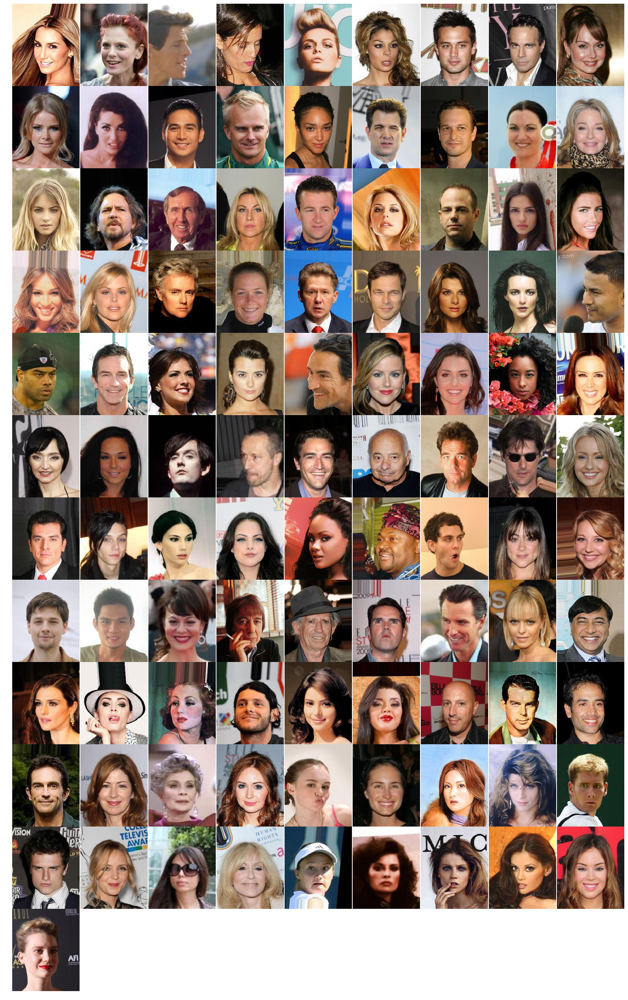

In [5]:
dataset_info(images)
plot_images(images)

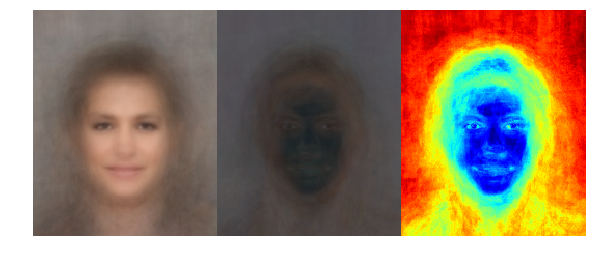

In [6]:
img_mean = np.mean(images, axis=0) # reduce entire dataset to a single representation which describes how most of the dataset looks like
img_std = np.std(images, axis=0) # where changes are likely to be in dataset
img_mean_channels = np.mean(img_std, axis=2) # average how every color chanel are vary as a hitmap. Red - more likely mean image isn't best representation, blue - less likely that mean image is far away from any possible image 
plot_images([img_mean, img_std, img_mean_channels])

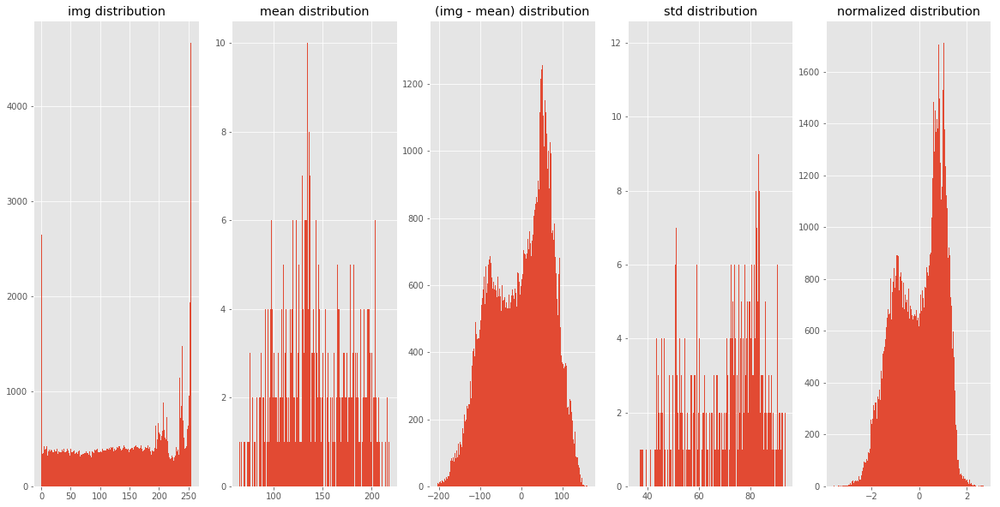

In [7]:
img = images[0]
img_mean = np.mean(images[0], axis=0)
img_unique = img - img_mean
img_std = np.std(images[0], axis=0)
img_norm = img_unique / img_std

values = [img, img_mean, img_unique, img_std, img_norm]
keys = [
    'img distribution',
    'mean distribution',
    '(img - mean) distribution',
    'std distribution',
    'normalized distribution'
]
plot_hist(keys, values)

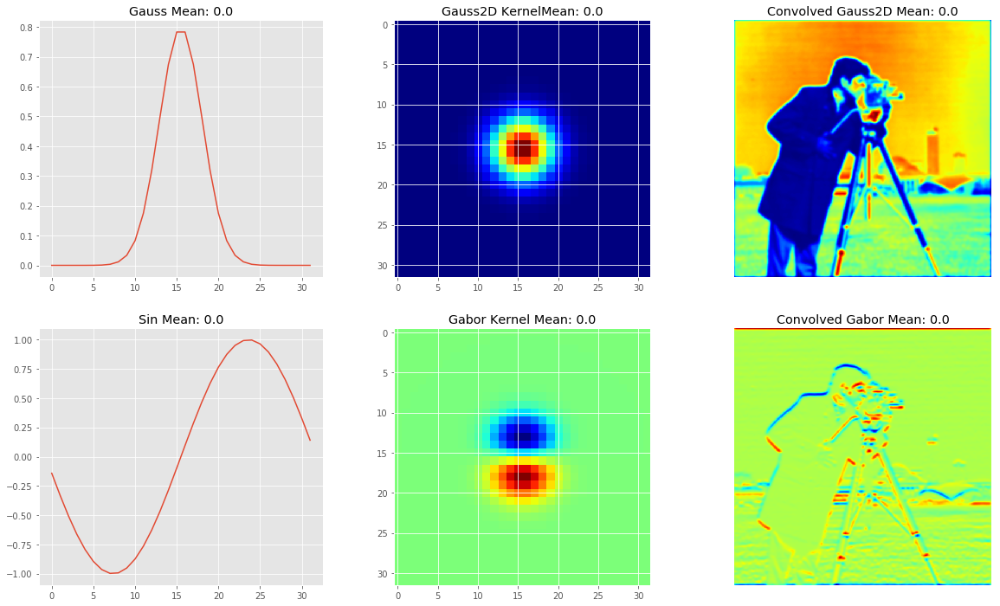

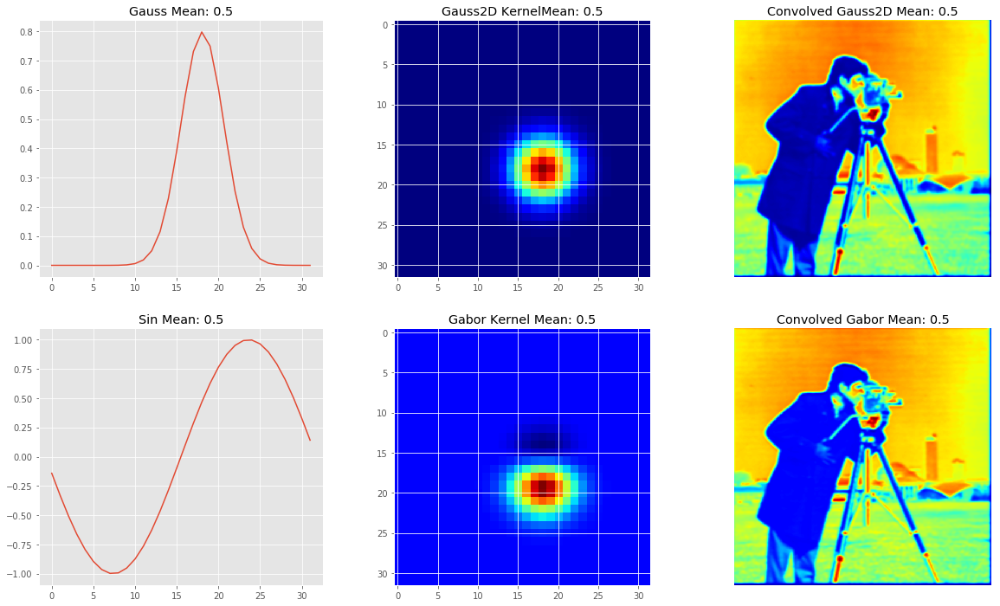

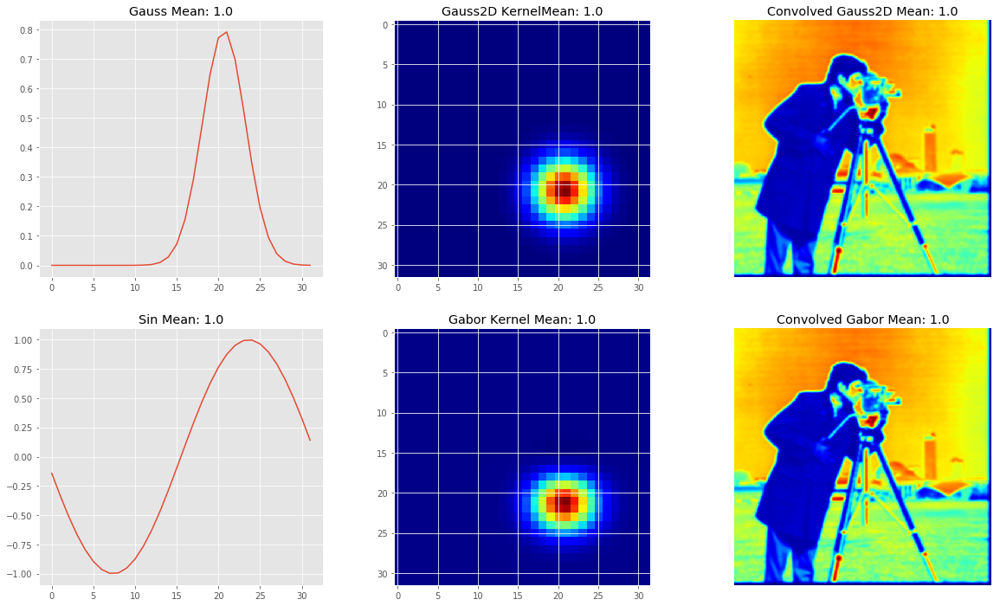

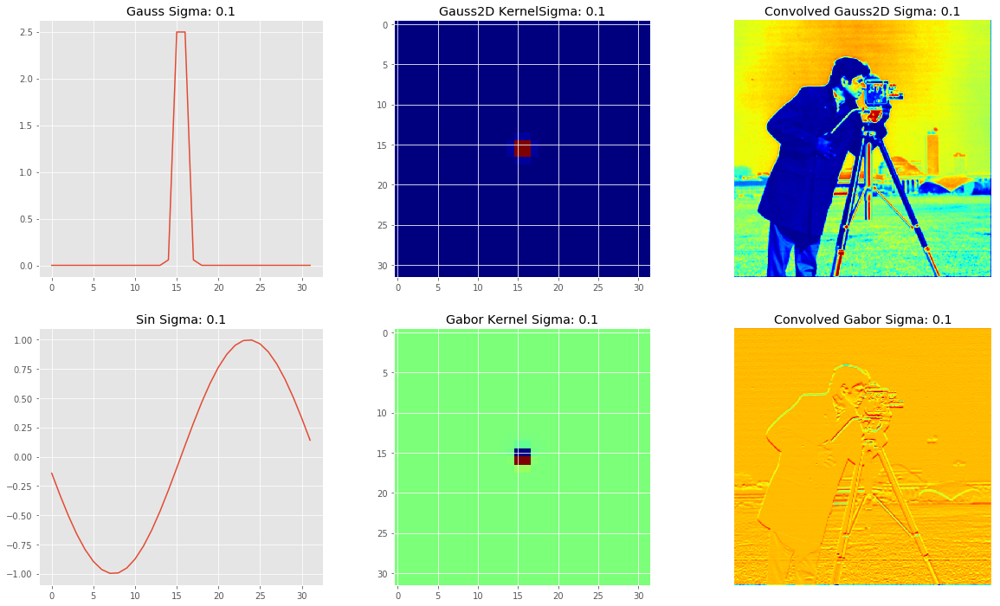

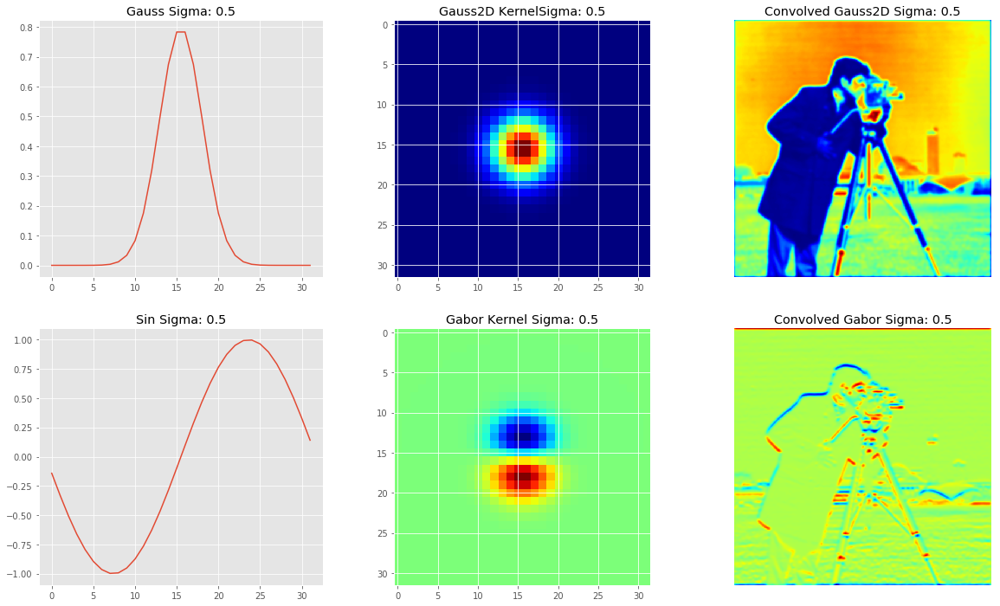

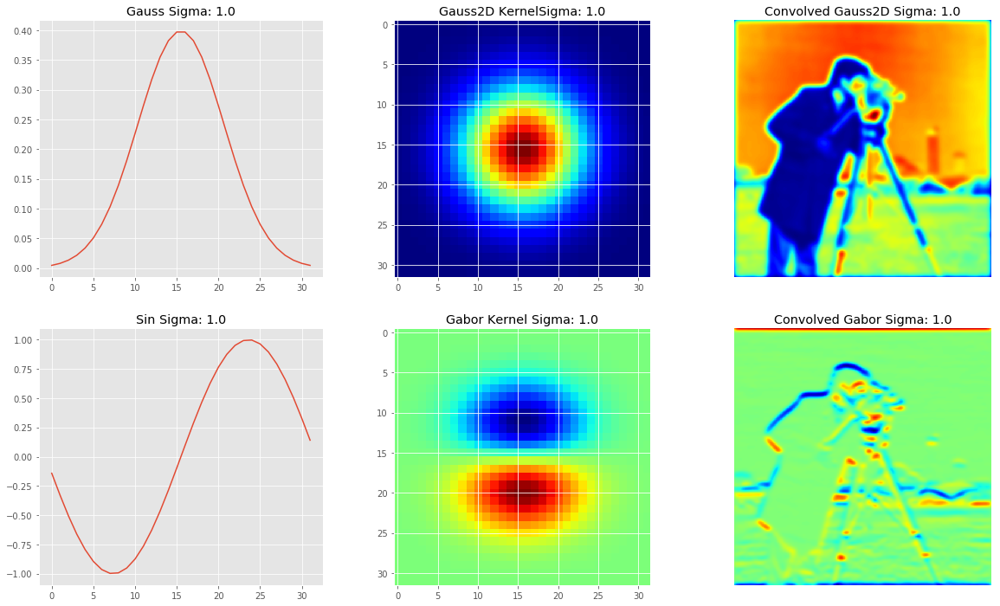

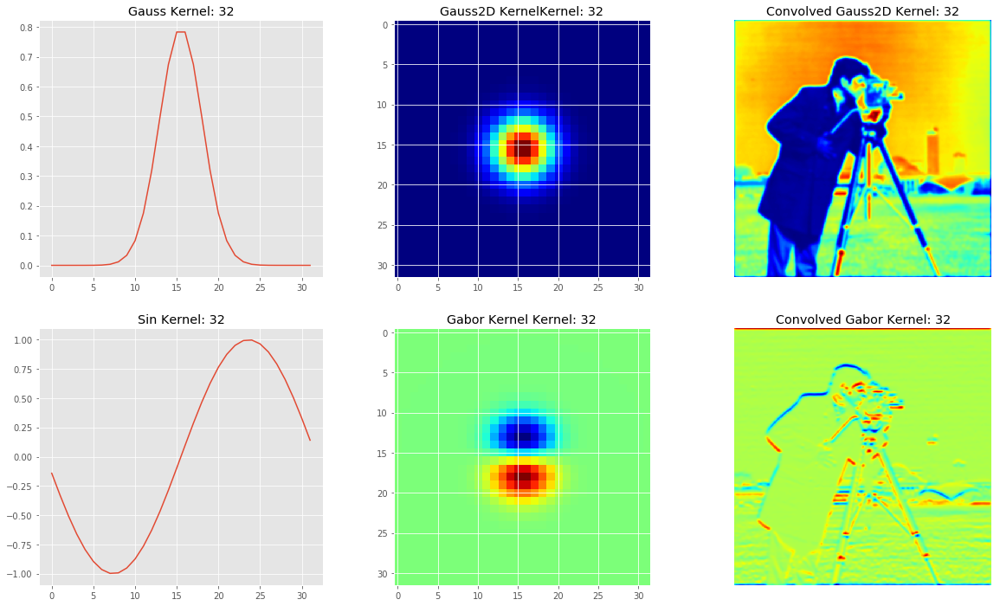

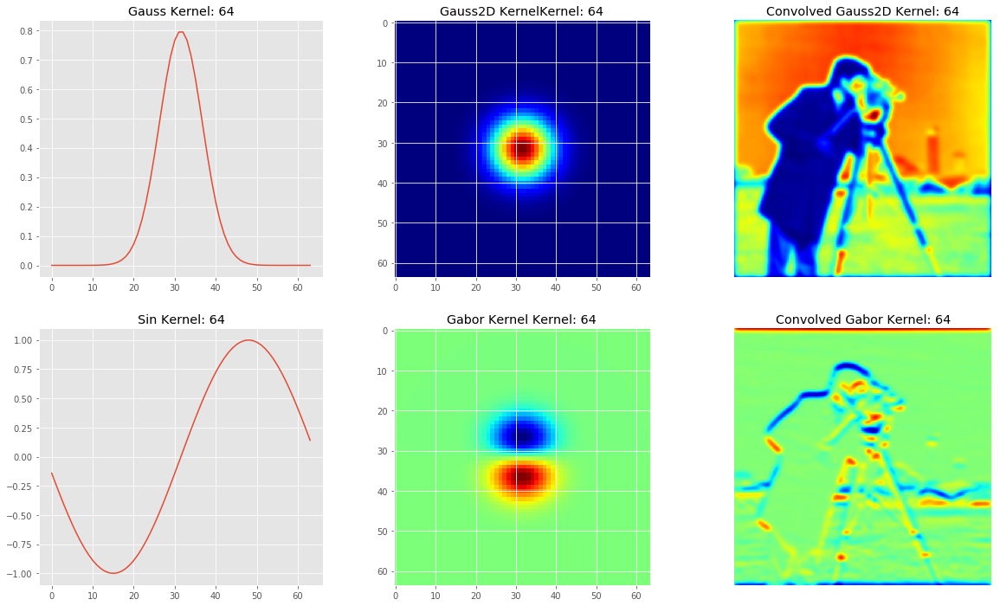

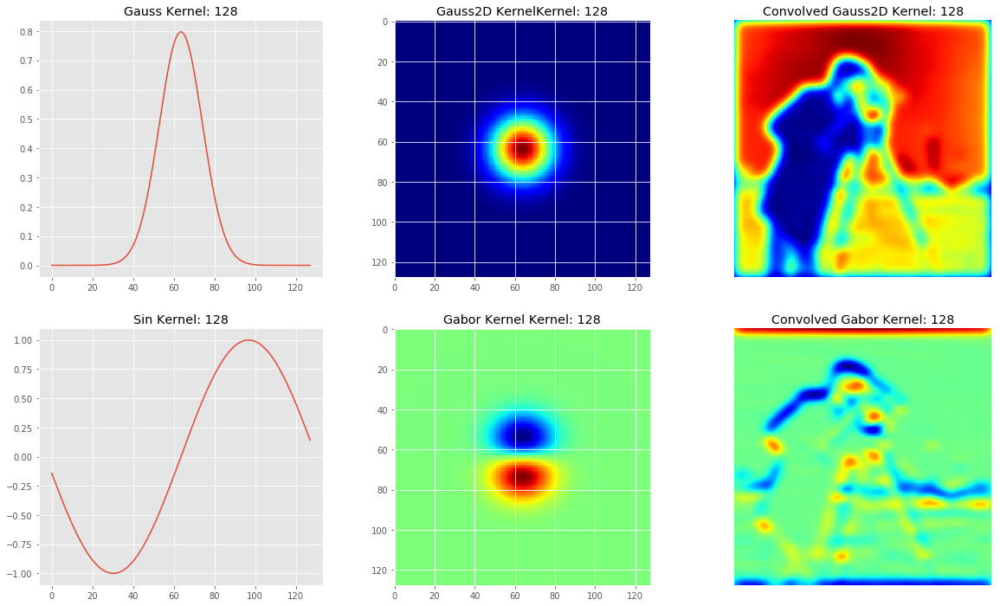

In [14]:
def show_source(img):
    plt.figure(figsize=(5,5))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(img.shape)
    plt.show()

def show_conv(result, title):
    res_plot_gauss, res_img_gauss2D, res_img_conv_gauss2D, res_plot_sin, res_plot_gabor, res_img_conv_gabor = result
    fig, axes = plt.subplots(2, 3, figsize=(20,12))
    
    axes[0, 0].plot(res_plot_gauss)
    axes[0, 0].set_title('Gauss ' + title)
    
    axes[0, 1].imshow(res_img_gauss2D, cmap='jet')
    axes[0, 1].set_title('Gauss2D Kernel' + title)
    
    axes[0, 2].imshow(np.squeeze(res_img_conv_gauss2D), cmap='jet')
    axes[0, 2].axis('off')
    axes[0, 2].set_title('Convolved Gauss2D ' + title)
    
    axes[1, 0].plot(res_plot_sin)
    axes[1, 0].set_title('Sin ' + title)
    
    axes[1, 1].imshow(res_plot_gabor, cmap='jet')
    axes[1, 1].set_title('Gabor Kernel ' + title)
    
    axes[1, 2].imshow(res_img_conv_gabor[0,:,:,0], cmap='jet')
    axes[1, 2].axis('off')
    axes[1, 2].set_title('Convolved Gabor ' + title)

    plt.show()
    plt.close(fig)

graph = tf.Graph()
with graph.as_default():
    p_mean = tf.placeholder(tf.float32, name='mean')
    p_sigma = tf.placeholder(tf.float32, name='sigma')
    p_ksize = tf.placeholder(tf.int32, name='ksize')
    p_img = tf.placeholder(tf.float32, shape=[None,None], name='img')

    t_x = tf.linspace(-3.0, 3.0, p_ksize)
    t_img = tf.expand_dims(p_img, 2)
    t_img = tf.expand_dims(t_img, 0)

    t_gauss = tf.exp(tf.negative(tf.pow(t_x - p_mean, 2.0) / (2.0 * tf.pow(p_sigma, 2.0)))) * (1.0 / (p_sigma * tf.sqrt(2.0 * 3.1415)))
    t_gauss2D = tf.matmul(tf.reshape(t_gauss, [p_ksize, 1]), tf.reshape(t_gauss, [1, p_ksize]))
    t_gauss_kernel = tf.reshape(t_gauss2D, [p_ksize, p_ksize, 1, 1])
    t_conv_gauss2D = tf.nn.conv2d(t_img, t_gauss_kernel, strides=[1,1,1,1], padding='SAME')

    t_sin_x = tf.sin(t_x)
    t_sin_y = tf.reshape(t_sin_x, [p_ksize, 1])
    t_ones = tf.ones(tf.stack([1, p_ksize]))
    t_wave = tf.matmul(t_sin_y, t_ones)
    t_gabor = tf.multiply(t_wave, t_gauss2D)
    t_gabor_kernel = tf.reshape(t_gabor, tf.stack([p_ksize, p_ksize, 1, 1]))
    t_conv_gabor = tf.nn.conv2d(t_img, t_gabor_kernel, strides=[1,1,1,1], padding='SAME')
    
with tf.Session(graph=graph) as sess:
    for mean in [0.0, 0.5, 1.0]:
        feed_dict={p_img: img, p_mean:mean, p_sigma:0.5, p_ksize:32}
        tensors = [t_gauss, t_gauss2D, t_conv_gauss2D, t_sin_y, t_gabor, t_conv_gabor]
        result = sess.run(tensors, feed_dict=feed_dict)
        show_conv(result, "Mean: {}".format(mean))
        
    for sigma in [0.1, 0.5, 1.0]:
        feed_dict={p_img: img, p_mean:0.0, p_sigma:sigma, p_ksize:32}
        tensors = [t_gauss, t_gauss2D, t_conv_gauss2D, t_sin_y, t_gabor, t_conv_gabor]
        result = sess.run(tensors, feed_dict=feed_dict)
        show_conv(result, "Sigma: {}".format(sigma))
        
    for kernel in [32, 64, 128]:
        feed_dict={p_img: img, p_mean:0.0, p_sigma:0.5, p_ksize:kernel}
        tensors = [t_gauss, t_gauss2D, t_conv_gauss2D, t_sin_y, t_gabor, t_conv_gabor]
        result = sess.run(tensors, feed_dict=feed_dict)
        show_conv(result, "Kernel: {}".format(kernel))